In [1]:
import pandas as pd
import os
cur_dir = os.getcwd()

In [2]:
raw_data = pd.read_csv(f'{cur_dir}\\data\\raw_data.csv')
raw_data.set_index(['composition','trial','time'],drop=True,inplace=True)

smooth_data = pd.read_csv(f'{cur_dir}\\data\\smooth_data.csv')
smooth_data.set_index(['composition','trial','time'],drop=True,inplace=True)

kinetic_data = pd.read_csv(f'{cur_dir}\\data\\kinetic_data.csv')
kinetic_data.set_index(['composition', 'time'],drop=True,inplace=True)

In [3]:
from data_processing.subtract_one_day import subtract_one_day
raw_data_adjusted = subtract_one_day(raw_data)

In [4]:
display(raw_data_adjusted.head(2))
display(smooth_data.head(2))
display(kinetic_data.head(2))

acetate  biomass  butanol  butyrate  ethanol
composition trial time                                              
1           1     0.58    21.61     0.41     0.04      0.06    10.94
                  0.65    44.31     0.39     0.05      0.08    15.89

acetate   biomass   butanol  butyrate    ethanol
composition trial time                                                    
1           1     0.0   16.905029  0.429546  0.029818  0.075529  15.895240
                  0.1   18.001195  0.421076  0.028260  0.061033  15.607023

acetate   biomass   butanol  butyrate    ethanol
composition time                                                    
1.0         0.0   15.992719  0.409529  0.105137  0.068777  16.239544
            0.1   17.928105  0.464472  0.105137  0.068777  16.239544

In [5]:
from data_processing.add_initial_values import add_initial_values
from data_processing.add_gas_comp import add_gas_comp

raw_data_for_conc_ml = add_initial_values(raw_data_adjusted, smooth_data)
smooth_data_for_conc_ml = add_initial_values(smooth_data, smooth_data)
kinetic_data_for_conc_ml = add_initial_values(kinetic_data, smooth_data)

raw_data_for_conc_ml = add_gas_comp(raw_data_for_conc_ml)
smooth_data_for_conc_ml = add_gas_comp(smooth_data_for_conc_ml)
kinetic_data_for_conc_ml = add_gas_comp(kinetic_data_for_conc_ml)

In [6]:
display(raw_data_for_conc_ml.head(2))
display(smooth_data_for_conc_ml.head(2))
display(kinetic_data_for_conc_ml.head(2))

acetate  biomass  butanol  butyrate  ethanol  \
composition trial time                                                 
1           1     0.58    21.61     0.41     0.04      0.06    10.94   
                  0.65    44.31     0.39     0.05      0.08    15.89   

                        acetate_0  biomass_0  butanol_0  butyrate_0  \
composition trial time                                                
1           1     0.58  15.992719   0.409529   0.105137    0.068777   
                  0.65  15.992719   0.409529   0.105137    0.068777   

                        ethanol_0   CO    CO2     H2  Flow Rate  
composition trial time                                           
1           1     0.58  16.239544  0.5  0.375  0.125          1  
                  0.65  16.239544  0.5  0.375  0.125          1

acetate   biomass   butanol  butyrate    ethanol  \
composition trial time                                                       
1           1     0.0   16.905029  0.429546  0.029818  0.075529  15.895240   
                  0.1   18.001195  0.421076  0.028260  0.061033  15.607023   

                        acetate_0  biomass_0  butanol_0  butyrate_0  \
composition trial time                                                
1           1     0.0   15.992719   0.409529   0.105137    0.068777   
                  0.1   15.992719   0.409529   0.105137    0.068777   

                        ethanol_0   CO    CO2     H2  Flow Rate  
composition trial time                                           
1           1     0.0   16.239544  0.5  0.375  0.125          1  
                  0.1   16.239544  0.5  0.375  0.125          1

acetate   biomass   butanol  butyrate    ethanol  \
composition time                                                       
1.0         0.0   15.992719  0.409529  0.105137  0.068777  16.239544   
            0.1   17.928105  0.464472  0.105137  0.068777  16.239544   

                  acetate_0  biomass_0  butanol_0  butyrate_0  ethanol_0   CO  \
composition time                                                                
1.0         0.0   15.992719   0.409529   0.105137    0.068777  16.239544  0.5   
            0.1   15.992719   0.409529   0.105137    0.068777  16.239544  0.5   

                    CO2     H2  Flow Rate  
composition time                           
1.0         0.0   0.375  0.125          1  
            0.1   0.375  0.125          1

In [7]:
from ml_conc_model.get_ml_conc_prediction_dict import get_ml_conc_prediction_dict

ml_conc_pred_dict_raw_rf = get_ml_conc_prediction_dict(raw_data_for_conc_ml,smooth_data_for_conc_ml, 'random forest')
ml_conc_pred_dict_smooth_rf = get_ml_conc_prediction_dict(smooth_data_for_conc_ml,smooth_data_for_conc_ml, 'random forest')
ml_conc_pred_dict_kinetic_rf = get_ml_conc_prediction_dict(kinetic_data_for_conc_ml,smooth_data_for_conc_ml, 'random forest')

ml_conc_pred_dict_raw_gb = get_ml_conc_prediction_dict(raw_data_for_conc_ml,smooth_data_for_conc_ml, 'gradient boosting')
ml_conc_pred_dict_smooth_gb = get_ml_conc_prediction_dict(smooth_data_for_conc_ml,smooth_data_for_conc_ml, 'gradient boosting')
ml_conc_pred_dict_kinetic_gb = get_ml_conc_prediction_dict(kinetic_data_for_conc_ml,smooth_data_for_conc_ml, 'gradient boosting')
# smooth_rf
# kinetic_rf
# raw_gb
# smooth_gb
# kinetic_gb

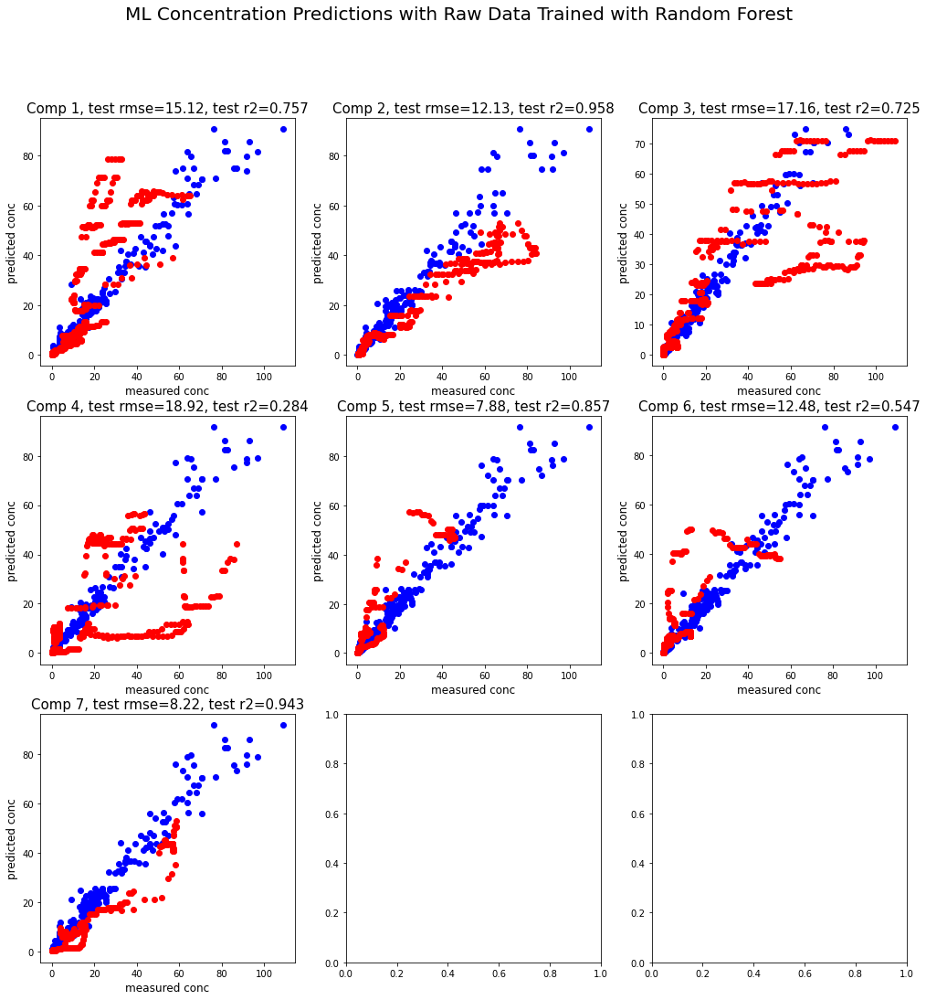

In [28]:
from plotting.plot_ml_predictions import plot_ml_predictions
plot_ml_predictions(
    ml_conc_pred_dict_raw_rf,
    'conc',
    'ML Concentration Predictions with Raw Data Trained with Random Forest'
)

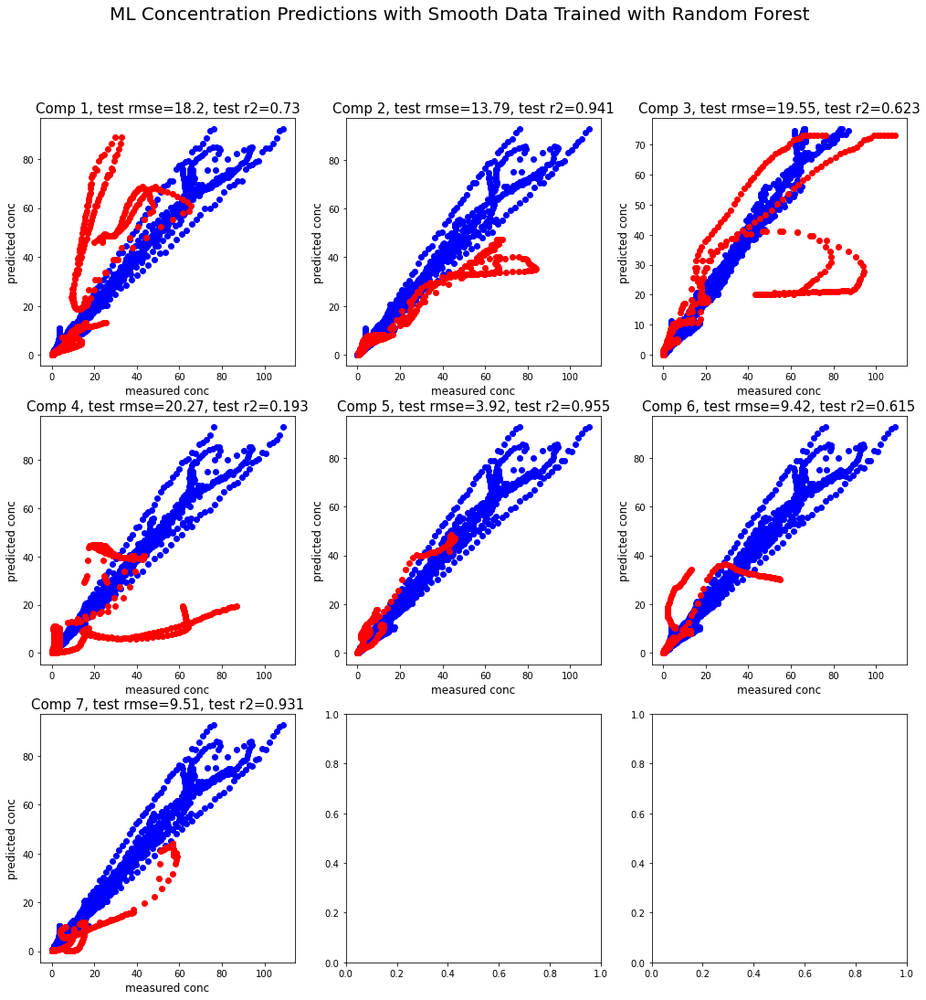

In [9]:
plot_ml_predictions(
    ml_conc_pred_dict_smooth_rf,
    'conc',
    'ML Concentration Predictions with Smooth Data Trained with Random Forest'
)

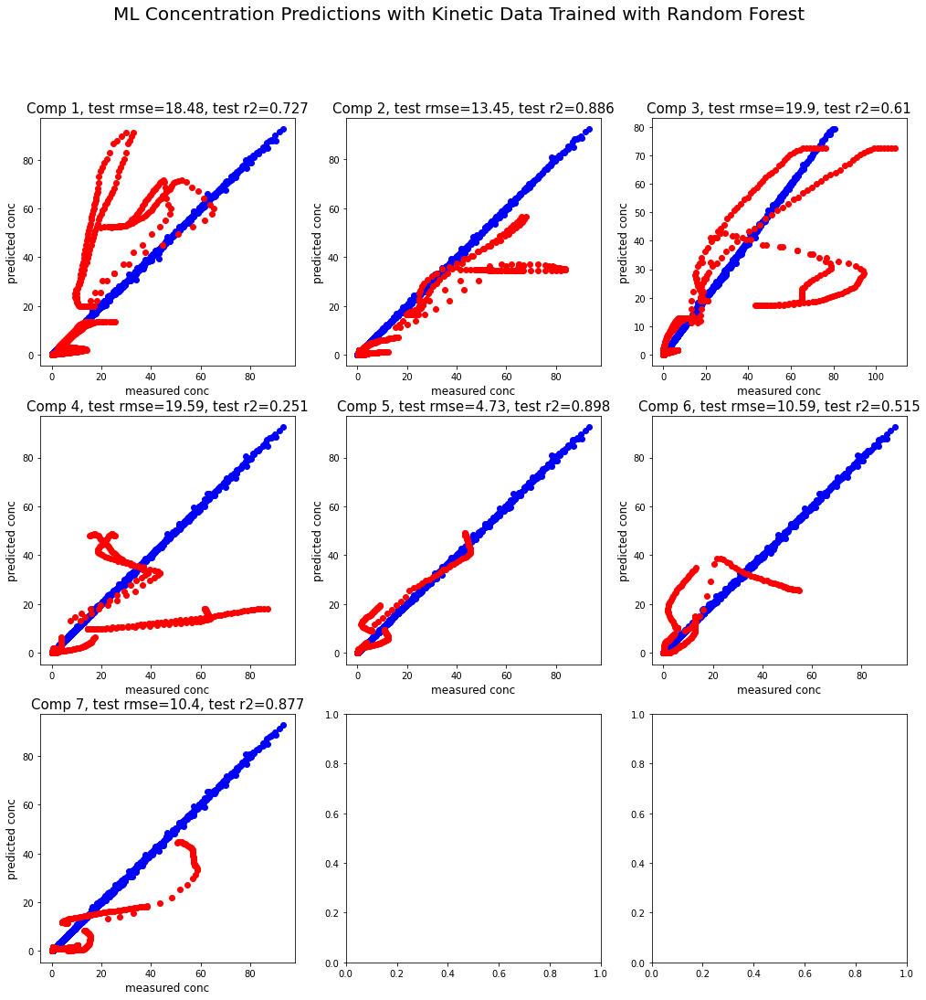

In [10]:
plot_ml_predictions(
    ml_conc_pred_dict_kinetic_rf,
    'conc',
    'ML Concentration Predictions with Kinetic Data Trained with Random Forest'
)

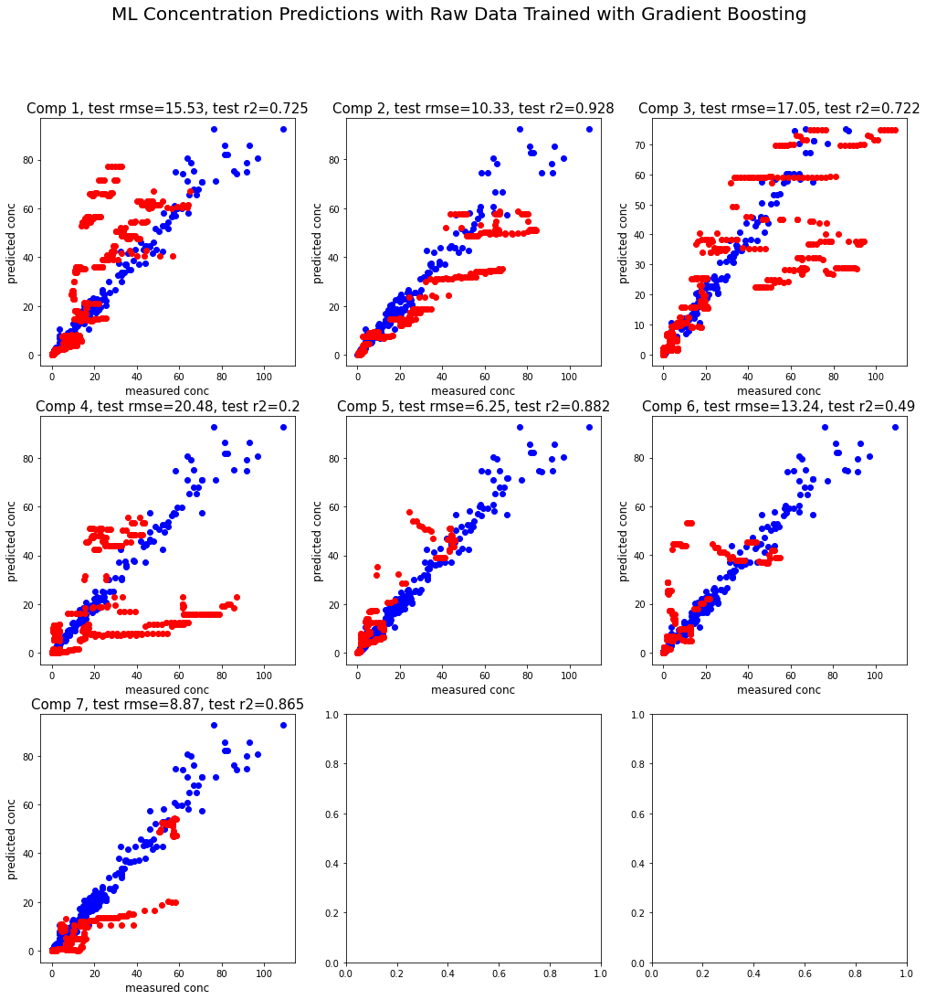

In [11]:
plot_ml_predictions(
    ml_conc_pred_dict_raw_gb,
    'conc',
    'ML Concentration Predictions with Raw Data Trained with Gradient Boosting'
)

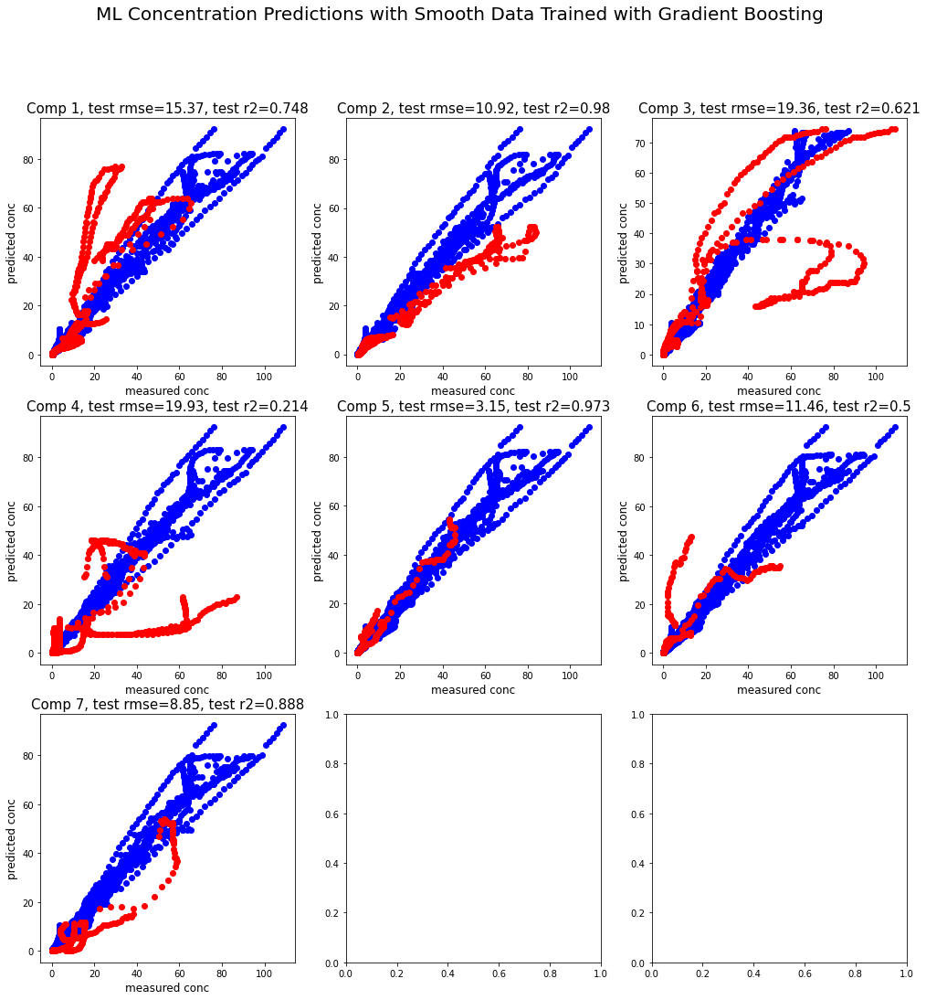

In [12]:
plot_ml_predictions(
    ml_conc_pred_dict_smooth_gb,
    'conc',
    'ML Concentration Predictions with Smooth Data Trained with Gradient Boosting'
)

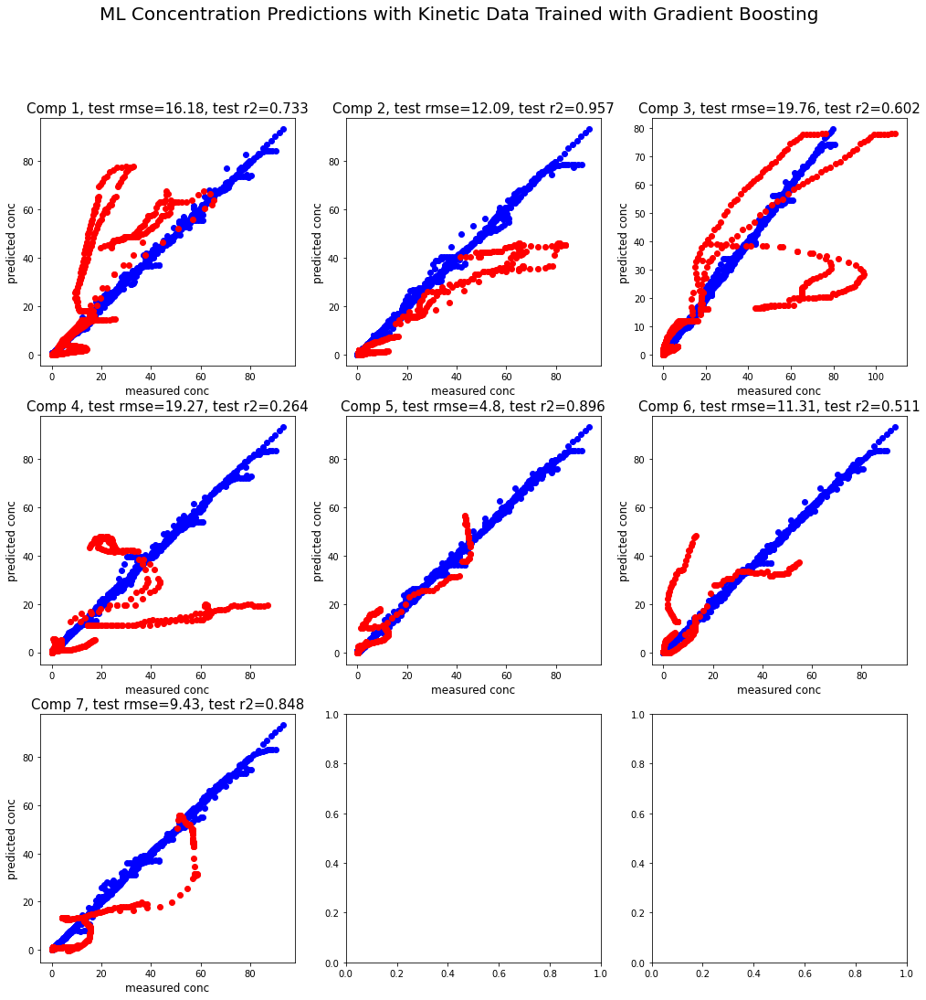

In [13]:
plot_ml_predictions(
    ml_conc_pred_dict_kinetic_gb,
    'conc',
    'ML Concentration Predictions with Kinetic Data Trained with Gradient Boosting'
)

In [21]:
from ml_conc_model.get_ml_conc_pred_df import get_ml_conc_pred_df

ml_conc_pred_df_raw_rf = get_ml_conc_pred_df(ml_conc_pred_dict_raw_rf, smooth_data)
ml_conc_pred_df_smooth_rf = get_ml_conc_pred_df(ml_conc_pred_dict_smooth_rf, smooth_data)
ml_conc_pred_df_kinetic_rf = get_ml_conc_pred_df(ml_conc_pred_dict_kinetic_rf, smooth_data)

ml_conc_pred_df_raw_gb = get_ml_conc_pred_df(ml_conc_pred_dict_raw_gb, smooth_data)
ml_conc_pred_df_smooth_gb = get_ml_conc_pred_df(ml_conc_pred_dict_smooth_gb, smooth_data)
ml_conc_pred_df_kinetic_gb = get_ml_conc_pred_df(ml_conc_pred_dict_kinetic_gb, smooth_data)

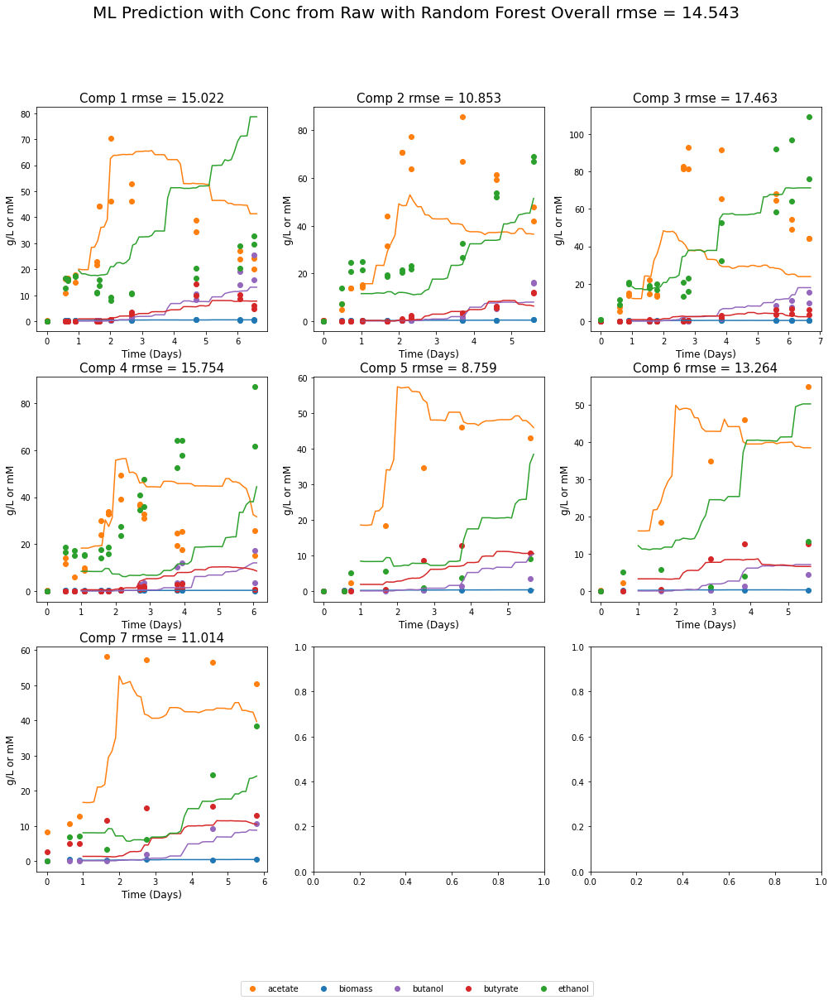

In [22]:
from plotting.plot_fit import plot_fit
plot_fit(ml_conc_pred_df_raw_rf, raw_data, 'ML Prediction with Conc from Raw with Random Forest')

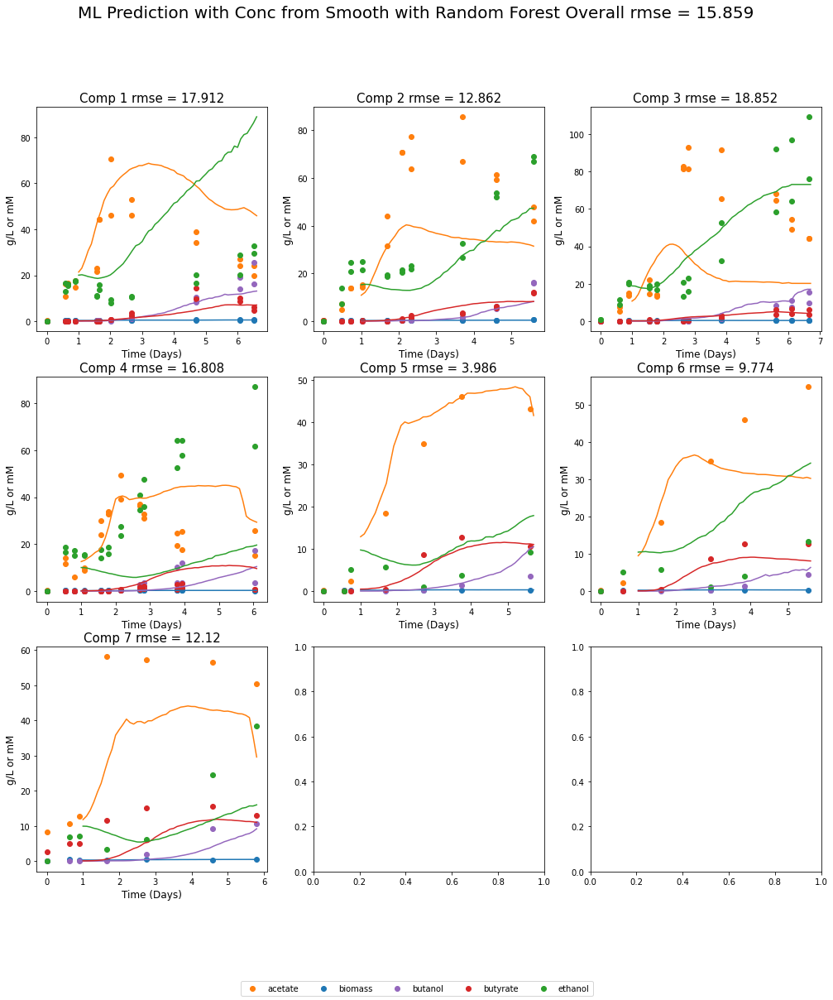

In [23]:
plot_fit(ml_conc_pred_df_smooth_rf, raw_data, 'ML Prediction with Conc from Smooth with Random Forest')

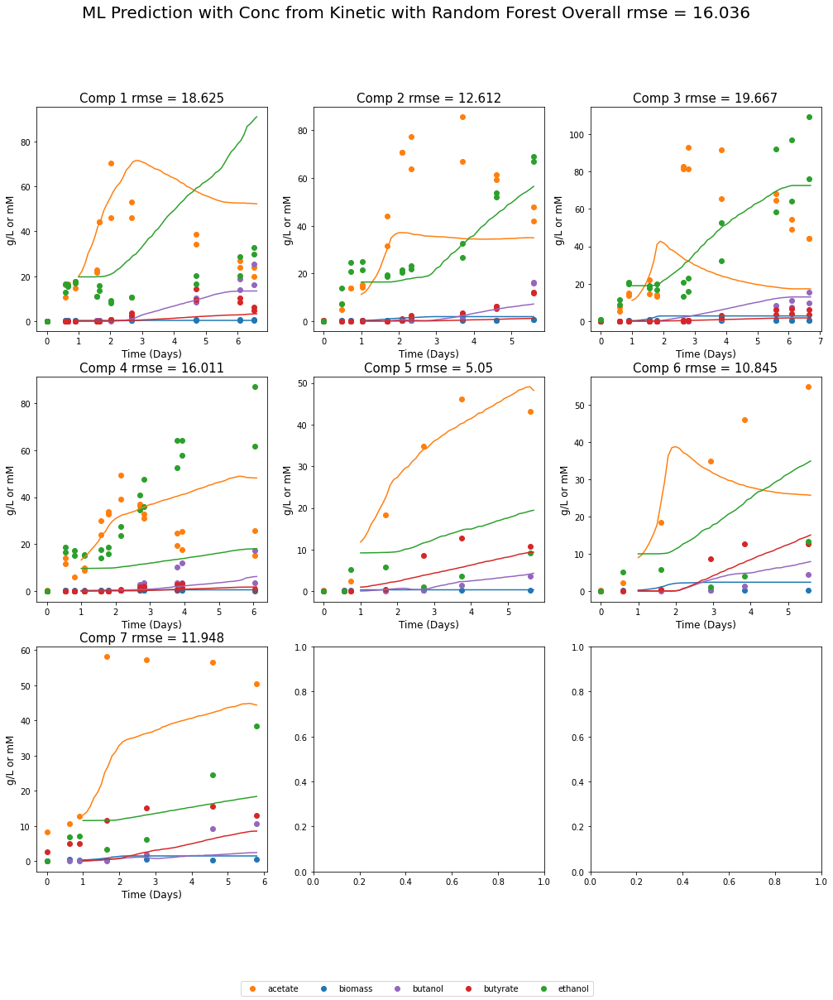

In [29]:
plot_fit(ml_conc_pred_df_kinetic_rf, raw_data, 'ML Prediction with Conc from Kinetic with Random Forest')

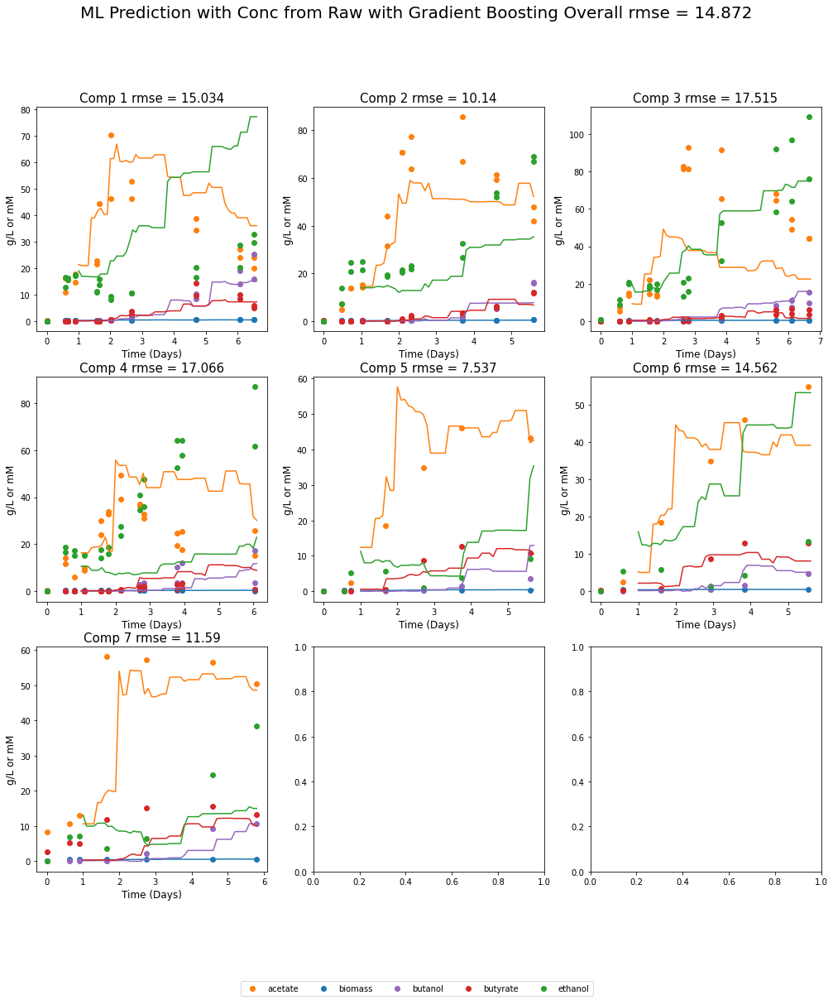

In [25]:
plot_fit(ml_conc_pred_df_raw_gb, raw_data, 'ML Prediction with Conc from Raw with Gradient Boosting')

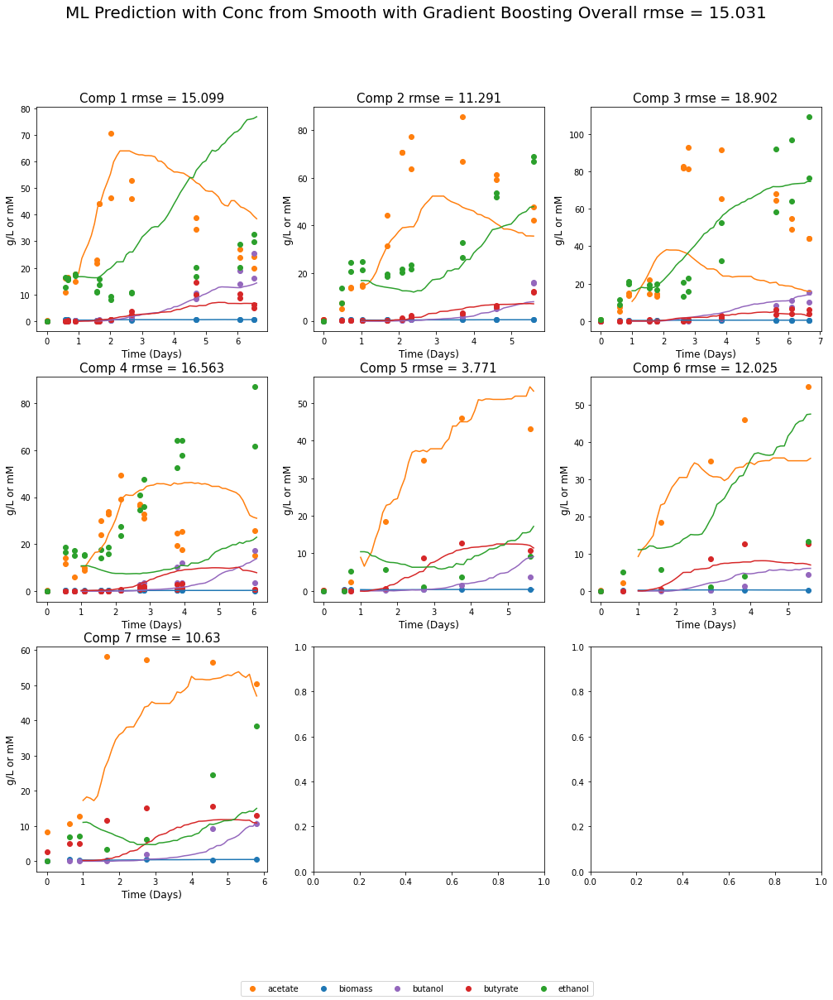

In [26]:
plot_fit(ml_conc_pred_df_smooth_gb, raw_data, 'ML Prediction with Conc from Smooth with Gradient Boosting')

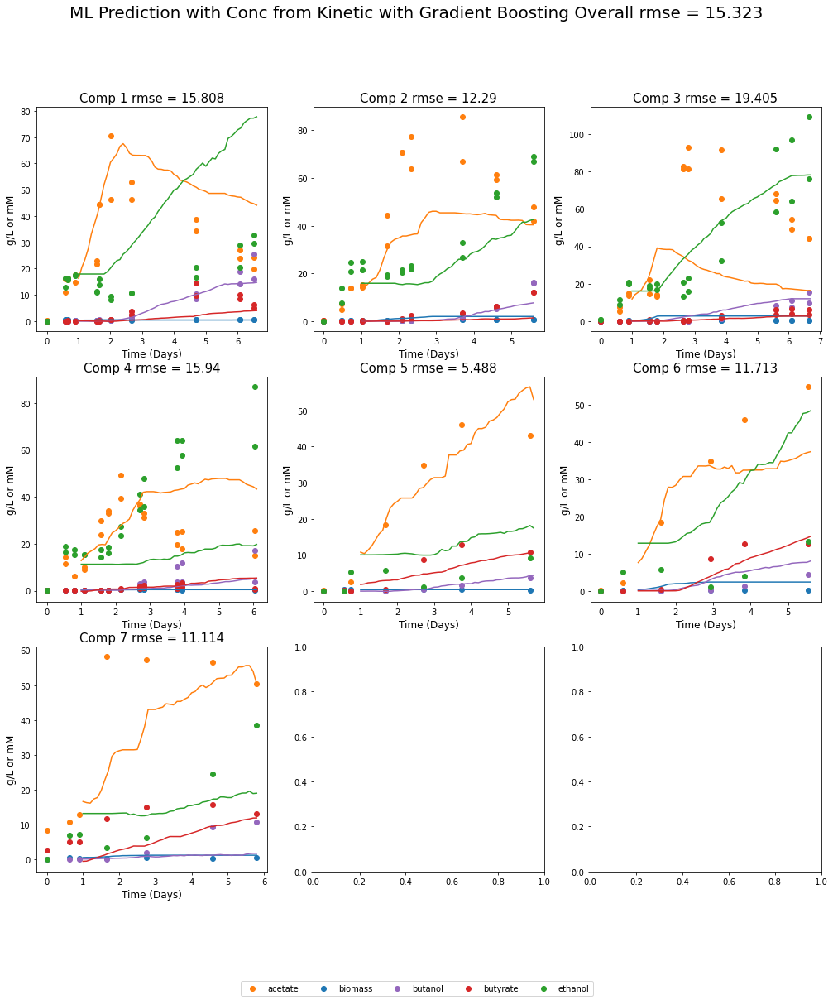

In [27]:
plot_fit(ml_conc_pred_df_kinetic_gb, raw_data, 'ML Prediction with Conc from Kinetic with Gradient Boosting')